- <a href='#1'>1. Load Dataset</a>  
- <a href='#2'>2. EDA and Data Preprocessing</a>
    - <a href='#2-1'>2.1. Missing value</a>
    - <a href='#2-2'>2.2. Does data have duplicates? </a>
    - <a href='#2-3'>2.3. check the quality of timestamp </a>
    - <a href='#2-4'>2.4. Distribution of target </a>
    - <a href='#2-5'>2.5 Features Distribution and Correlation </a>
- <a href='#3'>3. Modeling</a>
    - <a href='#3-1'>3.1 baseline</a>
         - <a href='#3-1-1'>3.1.1 model evaluation</a>
    - <a href='#3-2'>3.2 Model Improvement</a>
         - <a href='#3-2-1'>3.2.1 Model Hyperprameter Tunning</a>
         - <a href='#3-2-2'>3.2.2 Feature Enginerring</a>
         - <a href='#3-2-3'>3.2.3 Model Ensembling</a>
- <a href='#4'> 4. Business Recommendations</a>
    - <a href='#4-1'>4.1 Recommendations</a>
    - <a href='#4-2'>4.2 Future work</a>

In [20]:
import warnings
import sys
warnings.simplefilter('ignore')
import gc
import time
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.stats import norm, skew #for some statistics
color = sns.color_palette()
import plotly.offline as py
py.init_notebook_mode(connected=True)
from plotly.offline import init_notebook_mode, iplot
from datetime import datetime
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.offline as offline
offline.init_notebook_mode()
import matplotlib.pyplot as plt
# import cufflinks and offline mode
from plotly import tools
import pylab as pl
import cufflinks as cf
cf.go_offline()
%matplotlib inline

sys.path.insert(0, '.') #import my module
from bayes_optz import BayesianOptimization

import xgboost as xgb
from sklearn.grid_search import GridSearchCV
from time import time
from operator import itemgetter
from sklearn.cross_validation import  cross_val_score
from sklearn.ensemble import (RandomForestClassifier, AdaBoostClassifier, 
                              GradientBoostingClassifier, ExtraTreesClassifier)
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve,auc,confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.cross_validation import KFold as KFold_v
from sklearn.linear_model import Ridge

from datetime import datetime
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.model_selection import KFold, StratifiedKFold
from lightgbm import LGBMClassifier
from sklearn.metrics import average_precision_score

from IPython.display import Image
from IPython.core.display import HTML 

from keras.utils import to_categorical
from keras import models
from keras import layers
import tensorflow as tf

#### * Preprocess Function

In [2]:
def load_data(path,parse_dates):
    '''
    parse date variables, convert flag, remove id variables, one hot encode nominal variables, fill missing value
    @path: data file path
    @return: data read for quick dirty modeling
    '''
    df = pd.read_csv(path, sep='\t', parse_dates = parse_dates)
    df['dim_is_requested'] = df['dim_is_requested'].astype('int8')
    df['dim_is_instant_bookable'] = df['dim_is_instant_bookable'].astype('int8')
    return df

In [3]:
def missing_data(data):
    '''
    check total missing percentage    
    @data:dataframe
    @return missing dataframe
    '''
    total = data.isnull().sum().sort_values(ascending = False)
    percent = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending = False)
    return pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])

In [4]:
def check_duplicate(data,id_col):
    '''
    @data:dataframe
    @return:non duplicates dataframe
    '''

    if data[id_col].nunique() != data.shape[0]:
        print("id has duplicates!")
        # if have duplicate for all columns
        if not data[data.duplicated(keep=False)].empty:
            print("data has all columns duplicates!")
            # remove
            df = data.drop_duplicates(keep=False)
            print('{} duplicate records remove'.format(data.shape[0]-df.shape[0]))
    
    return df

In [5]:
def skewness_rnking(df):
    
    numeric_feats = df.dtypes[(df.dtypes != "object") ].index
    skewed_feats = df[numeric_feats].apply(lambda x: skew(x.dropna())).sort_values(ascending=False)
    print("\nSkew in numerical features: \n")
    skewness = pd.DataFrame({'Skew' :skewed_feats})
    return skewness.head(10)

#### * Model Function

In [6]:
def plot_roc(lines,fname):
    pl.clf()
    for fpr, tpr, label,auc in lines:
        pl.plot(fpr,tpr, label=label + " (auc = %0.3f)"%auc)
    pl.plot([0, 1], [0, 1], color='navy',  linestyle='--', label="Random" + " (auc = 0.5)" )
    pl.xlabel('FPR')
    pl.ylabel('TPR')
    pl.ylim([0.0, 1.05])
    pl.xlim([0.0, 1.0])
    pl.title('ROC')
    pl.legend(loc="lower right")
    pl.show()
    pl.savefig('./output/{}.png'.format(fname))        
def get_roc_plot(res,fname):
    lines = []
    for y_pred, y_true,label in res:
        fpr, tpr, _ = roc_curve(y_true, y_pred)
        lines.append((fpr, tpr,label,auc(fpr,tpr,reorder=True)))
    plot_roc(lines,fname)
    
    
def get_pr_plot(res,fname):
    lines = []
    for y_pred, y_true,label in res:
        precision, recall, threshold = precision_recall_curve(y_true, y_pred)
        lines.append((precision, recall, label ))
    base_rate = sum(res[0][1])/len(res[0][1])
    plot_precision_recall(lines,base_rate,fname)    

def plot_precision_recall(lines,base_rate,fname):
    pl.clf()

    for precision, recall, label in lines:
        pl.plot(recall, precision, label=label)
    pl.axhline(y=base_rate, color='navy',  linestyle='--', label="Random" )
    pl.xlabel('Recall')
    pl.ylabel('Precision')
    pl.ylim([0.0, 1.05])
    pl.xlim([0.0, 1.0])
    pl.title('Precision-Recall')
    pl.legend(loc="upper right")
    pl.show()
    pl.savefig('./output/{}.png'.format(fname))

In [7]:
excluded_features = [ 'id_listing_anon','ds_night',  'ds',  'id_user_anon', 'index']


def prep_and_split(df,target):

    ##########constant features##############
    const_cols = [c for c in df.columns if df[c].nunique(dropna=False)==1 ]
    print('constant conlumns is:',const_cols)
    df.drop(const_cols, axis=1, inplace=True)

    ##########factortized categoricals##############

    for c in excluded_features :
        if c in df:
            print('drop {}'.format(c))
            df.drop(c, axis=1, inplace=True)
            print('shape: {}'.format(df.shape)) 
            
    ##########factortized categoricals##############
    categorical_features = [_f for _f in df.columns if (_f not in excluded_features) & (df[_f].dtype == 'object')]
    for f in categorical_features:
        df[f], indexer = pd.factorize(df[f])
    
    df.fillna(0, inplace=True)

    x = df.drop([target],axis = 1)
    y = df[target]
    X_train, X_test, y_train, y_test =train_test_split(x,y,test_size = 0.30, random_state = 0)
    df.to_csv('./input/tmp.csv',index=False)

    print('X_train shape:',X_train.shape)
    print('y_train shape:',y_train.shape)
    print('X_test shape:',X_test.shape)
    print('y_test shape:',y_test.shape)

    del df
    gc.collect()
    return  X_train, X_test, y_train, y_test


def sklearn_prep_split(data_path):
    df=pd.read_csv(data_path)
    for c in excluded_features :
        if c in df:
            print('drop {}'.format(c))
            df.drop(c, axis=1, inplace=True)
            print('shape: {}'.format(df.shape))   
     
    train = pd.get_dummies(df)
    x = train.drop(['dim_is_requested'],axis = 1)
    y = train['dim_is_requested']
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size = 0.30, random_state = 0)
    x_train.reset_index(drop=True,inplace=True)
    x_test.reset_index(drop=True,inplace=True)
    y_train.reset_index(drop=True,inplace=True)
    y_test.reset_index(drop=True,inplace=True)    
    
    
    x_train.fillna(0, inplace = True)
    x_test.fillna(0, inplace = True)
    
    x_train.replace(np.inf, -1, inplace=True)
    x_train.replace(-np.inf, -1, inplace=True)
    x_test.replace(np.inf, -1, inplace=True)
    x_test.replace(-np.inf, -1, inplace=True)

    return x_train,x_test,y_train,y_test

In [8]:
def model_score_ranking(y_train, y_train_pred, n_bin = 10):
    model_res =pd.DataFrame()
    bins = [i/n_bin for i in range(n_bin+1)]
    model_res['pred_flag'] = y_train_pred
    model_res['true_flag'] = y_train.values
    sampled_df = model_res
    model_res['pred_flag_bin'] = pd.qcut(model_res['pred_flag'],q=bins)
    sampled_df['pred_flag_bin'] = pd.qcut(sampled_df['pred_flag'],q=bins)
    return sampled_df.groupby(['pred_flag_bin']).agg({'true_flag':['count','mean']})

In [9]:
# Lightgbm
class Model(object):
    def __init__(self, name, clf,comment=None, remove_columns = None,
                 param = None, kfold_seed = 47, lgb_seed = None, n_estimators = 500, log = None
                 ,BASE_X_PATH = None
                , BASE_Y_PATH = None):
        self.name = name
        self.comment = comment


        if log is None:
            self.logfile = open('./output/{}.txt'.format(name), 'w')
        else:
            self.logfile = open('./output/{}.txt'.format(log), 'w')

        if param is None:
            self.param = {
                'objective': 'binary',
                'learning_rate': 0.1,
                'colsample_bytree': 0.8,
                'max_depth': 3,
                'metric': 'auc',
                'n_estimators': n_estimators,
                'boosting_type': 'goss'
            }
        else:
            self.param = param

        if lgb_seed is not None:
            self.param['seed'] = lgb_seed
        self.param['n_estimators'] = n_estimators
        self.kfold_seed = kfold_seed
        self.feature_importance_df = None
        self.classifiers = []

        if BASE_X_PATH is not None:
            self.x = pd.read_csv(BASE_X_PATH).reset_index(drop=True)

        if remove_columns is not None:
            self.x.drop(remove_columns, axis=1, inplace=True)
            
        ## folds    
        self.folds=KFold(n_splits=5, shuffle=True, random_state=self.kfold_seed)
        ## model
        self.clf = clf(**self.param)


        self.x_train, self.x_test, self.y_train, self.y_test = prep_and_split(self.x,'dim_is_requested')
        self.x_train.reset_index(drop=True,inplace=True)
        self.x_test.reset_index(drop=True, inplace=True)


    # Display/plot feature importance
    def display_importances(self, feature_importance_df_, filename, n=100):
        cols = feature_importance_df_[["feature", "importance"]].groupby("feature").mean().sort_values(by="importance",
                                                                                                       ascending=False)[
               :n].index

        import matplotlib.pyplot as plt
        import seaborn as sns
        plt.switch_backend('agg')
        best_features = feature_importance_df_.loc[feature_importance_df_.feature.isin(cols)]
        plt.figure(figsize=(10, 16))
        sns.barplot(x="importance", y="feature", data=best_features.sort_values(by="importance", ascending=False))
        plt.title('LightGBM Features (avg over folds)')
        plt.tight_layout()
        plt.savefig('./output/{}.png'.format(filename))
        plt.show()

    # Bayesion Opimization Tunning    
    def model_evaluate(self,**Tunparams):
        warnings.filterwarnings("ignore")
        
        Tunparams['num_leaves'] = int(Tunparams['num_leaves'])
        Tunparams['max_depth'] = int(Tunparams['max_depth'])           
        oof_preds = np.zeros(self.x_train.shape[0])        

        for n_fold, (train_idx, valid_idx) in enumerate(self.folds.split(self.x_train, self.y_train)):
            train_x, train_y = self.x_train.iloc[train_idx], self.y_train.iloc[train_idx]
            valid_x, valid_y = self.x_train.iloc[valid_idx], self.y_train.iloc[valid_idx]

            self.clf.fit(train_x, train_y, eval_set=[(valid_x, valid_y)],
                    eval_metric='auc', verbose=100, early_stopping_rounds=200)

            oof_preds[valid_idx] = self.clf.predict_proba(valid_x, num_iteration=self.clf.best_iteration_)[:, 1]

            del  train_x, train_y, valid_x, valid_y
            gc.collect()


        return roc_auc_score(self.y_train, oof_preds) 
    
    
    
    
    def cv(self, nfolds=5,tune=True):
        self.classifiers.clear()
        self.Tunparams={'colsample_bytree': (0.3, 1),
                          'learning_rate': (.02, .1), 
                          'num_leaves': (20, 50), 
                          'subsample': (0.3, 1), 
                          'max_depth': (2, 6), 
                          'reg_alpha': (.03, .1), 
                          'reg_lambda': (.06, .1), 
                          'min_split_gain': (.01, .1),
                          'min_child_weight': (10, 50)
                          }
        folds = KFold(n_splits=nfolds, shuffle=True, random_state=self.kfold_seed)
        self.feature_importance_df = pd.DataFrame()

        oof_preds = np.zeros(self.x_train.shape[0])
        preds_test = np.empty((nfolds, self.x_test.shape[0]))
        

        if self.comment is not None:
            self.logfile.write('comment: {}\n'.format(self.comment))

            
            
        #Tune parameters
        if tune:
                bo = BayesianOptimization(self.model_evaluate, self.Tunparams)
                bo.maximize(init_points = 5, n_iter =5)


                best_params = bo.res['max']['max_params']
                best_params['num_leaves'] = int(best_params['num_leaves'])
                best_params['max_depth'] = int(best_params['max_depth'])
                self.logfile.write('best param process: {}\n'.format(bo.res['max']['max_val']))
                self.param.update(best_params)
                self.logfile.write('best param: {}\n'.format(self.param))
                print("Params after Tuniing:", self.param)
                
        self.logfile.write('param: {}\n'.format(self.param))

        


        
        
        
        #### OOF
        self.logfile.write('output: ./output/{}.csv\n'.format(self.name))
        self.logfile.flush()
        import time
        for n_fold, (train_idx, valid_idx) in enumerate(folds.split(self.x_train, self.y_train)):
            fstart = time.time()
            train_x, train_y = self.x_train.iloc[train_idx], self.y_train.iloc[train_idx]
            valid_x, valid_y = self.x_train.iloc[valid_idx], self.y_train.iloc[valid_idx]

            # LightGBM parameters found by Bayesian optimization
            self.clf.fit(train_x, train_y, eval_set=[(valid_x, valid_y)],
                    eval_metric='auc', verbose=25, early_stopping_rounds=200)

            oof_preds[valid_idx] = self.clf.predict_proba(valid_x, num_iteration=self.clf.best_iteration_)[:, 1]
            preds_test[n_fold, :] = self.clf.predict_proba(self.x_test, num_iteration=self.clf.best_iteration_)[:, 1]

            fold_importance_df = pd.DataFrame()
            fold_importance_df["feature"] = self.x_train.columns.tolist()
            fold_importance_df["importance"] = self.clf.feature_importances_
            fold_importance_df["fold"] = n_fold + 1
            self.feature_importance_df = pd.concat([self.feature_importance_df, fold_importance_df], axis=0)

            strlog = '[{}][{:.1f} sec] Fold {} AUC : {:.6f}'.format(str(datetime.now()), time.time() - fstart, n_fold + 1, roc_auc_score(valid_y, oof_preds[valid_idx]))
            print(strlog)
            self.logfile.write(strlog+'\n')
            self.logfile.flush()

            self.classifiers.append(self.clf)
            del  train_x, train_y, valid_x, valid_y
            gc.collect()
            
            
        #### Scores and plots
        import matplotlib.pyplot as plt
        import seaborn as sns
        plt.switch_backend('agg')
        plt.figure(figsize=(10, 10))
        plt.show()
        
        ## Train
        full_auc = roc_auc_score(self.y_train, oof_preds)
        average_precision = average_precision_score(self.y_train, oof_preds)
        strlog = 'Full AUC score {:.6f}'.format(full_auc)
        print(strlog)
        self.logfile.write(strlog+'\n')
        strlog = 'Full average_precision score {:.6f}'.format(average_precision)
        print(strlog)
        self.logfile.write(strlog+'\n')
        
        ## Test
        preds = preds_test.mean(axis=0)
        test_full_auc = roc_auc_score(self.y_test, preds)
        average_precision = average_precision_score(self.y_test, preds)
        
        strlog = 'Validation Full AUC score {:.6f}'.format(test_full_auc)
        print(strlog)
        self.logfile.write(strlog+'\n')
        strlog = 'Validation Full average_precision score {:.6f}'.format(average_precision)
        print(strlog)
        self.logfile.write(strlog+'\n')        

        
        res = [(oof_preds, self.y_train,  "Train"), (preds,self.y_test, "Validation")]
        get_roc_plot(res,'roc_lgm')
        get_pr_plot(res,'pr_lgm')
        
        
        cols = self.feature_importance_df[["feature", "importance"]].groupby("feature").mean().sort_values(by="importance", ascending=False)[:100].index
        self.logfile.write('top features:\n')
        for c in cols:
            self.logfile.write('{}\n'.format(c))

        self.logfile.flush()

        self.display_importances(self.feature_importance_df, self.name)

        return self.feature_importance_df, full_auc,average_precision_score,self.clf,\
               oof_preds, self.y_train, preds,self.y_test,self.x_train,self.x_test


In [10]:
# stacking starter
# Modfied from https://www.kaggle.com/mmueller/stacking-starter?scriptVersionId=390867/code
class SklearnWrapper(object):
    def __init__(self, clf, seed=7, params=None):
        params['random_state'] = seed
        self.clf = clf(**params)

    def train(self, x_train, y_train):
        print("Training..")
        self.clf.fit(x_train, y_train)

    def predict(self, x):
        print("Predicting..")
        return self.clf.predict_proba(x)


class XgbWrapper(object):
    def __init__(self, seed=0, params=None):
        self.param = params
        self.param['seed'] = seed
        self.nrounds = params.pop('nrounds', 250)

    def train(self, x_train, y_train):
        dtrain = xgb.DMatrix(x_train, label=y_train)
        print("Training..")
        self.gbdt = xgb.train(self.param, dtrain, self.nrounds)

    def predict(self, x):
        print("Predicting..")
        return self.gbdt.predict(xgb.DMatrix(x))


def get_oof(clf):
    oof_train = np.zeros((ntrain,))
    oof_test = np.zeros((ntest,))
    oof_test_skf = np.empty((NFOLDS, ntest))

    for i, (train_index, test_index) in enumerate(kf):
        x_tr = x_train[train_index]
        y_tr = y_train[train_index]
        x_te = x_train[test_index]
        
        clf.train(x_tr, y_tr)

        oof_train[test_index] = clf.predict(x_te)[:,1]  # or [:,0]
        oof_test_skf[i, :] = clf.predict(x_test)[:,1]  # or [:,0]

    oof_test[:] = oof_test_skf.mean(axis=0)
    return oof_train.reshape(-1, 1), oof_test.reshape(-1, 1)
    
def get_oof_xgb(clf):
    oof_train = np.zeros((ntrain,))
    oof_test = np.zeros((ntest,))
    oof_test_skf = np.empty((NFOLDS, ntest))

    for i, (train_index, test_index) in enumerate(kf):
        x_tr = x_train[train_index]
        y_tr = y_train[train_index]
        x_te = x_train[test_index]

        clf.train(x_tr, y_tr)

        oof_train[test_index] = clf.predict(x_te)  # or [:,0]
        oof_test_skf[i, :] = clf.predict(x_test)  # or [:,0]

    oof_test[:] = oof_test_skf.mean(axis=0)
    return oof_train.reshape(-1, 1), oof_test.reshape(-1, 1)

# <a id='1'>1. Load Dataset </a> 

In [11]:
data = load_data('./input/TH_data_challenge.tsv'
                  ,parse_dates=['ds_night','ds']
                  )

In [12]:
data.shape

(184279, 46)

In [13]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 184279 entries, 0 to 184278
Data columns (total 46 columns):
dim_is_requested                                      184279 non-null int8
ds_night                                              184279 non-null datetime64[ns]
ds                                                    184279 non-null datetime64[ns]
id_listing_anon                                       184279 non-null object
id_user_anon                                          184279 non-null object
m_effective_daily_price                               184279 non-null float64
m_pricing_cleaning_fee                                184279 non-null float64
dim_market                                            184279 non-null object
dim_lat                                               184279 non-null float64
dim_lng                                               184279 non-null float64
dim_room_type                                         184279 non-null object
dim_person_capacity     

In [14]:
data.head()

,dim_is_requested,ds_night,ds,id_listing_anon,id_user_anon,m_effective_daily_price,m_pricing_cleaning_fee,dim_market,dim_lat,dim_lng,dim_room_type,dim_person_capacity,dim_is_instant_bookable,m_checkouts,m_reviews,days_since_last_booking,cancel_policy,image_quality_score,m_total_overall_rating,m_professional_pictures,dim_has_wireless_internet,ds_night_day_of_week,ds_night_day_of_year,ds_checkin_gap,ds_checkout_gap,occ_occupancy_plus_minus_7_ds_night,occ_occupancy_plus_minus_14_ds_night,occ_occupancy_trailing_90_ds,m_minimum_nights,m_maximum_nights,price_booked_most_recent,p2_p3_click_through_score,p3_inquiry_score,listing_m_listing_views_2_6_ds_night_decay,general_market_m_unique_searchers_0_6_ds_night,general_market_m_contacts_0_6_ds_night,general_market_m_reservation_requests_0_6_ds_night,general_market_m_is_booked_0_6_ds_night,m_available_listings_ds_night,kdt_score,r_kdt_listing_views_0_6_avg_n100,r_kdt_n_active_n100,r_kdt_n_available_n100,r_kdt_m_effective_daily_price_n100_p50,r_kdt_m_effective_daily_price_available_n100_p50,r_kdt_m_effective_daily_price_booked_n100_p50
0,0,2015-01-06,2014-12-07,0ae0c7cc-a8a4-425f-9ccc-8b25dbb94f4d,dcc74708-d5c4-47b2-bc0c-97bf5abfcd99,110.000000,60.0,Los Angeles,34.053932,-118.362970,Private room,2,0,24.0,19.0,320.0,4,0.830959,74.0,16.0,1,2,6,0.0,7.0,NaN,NaN,0.000000,5.0,90.0,92.0,NaN,NaN,0.133333,788.142857,241.428571,41.428571,1.0,9840,1.314286,1.795918,57.0,48.0,79.0,75.0,98.0
1,1,2015-01-21,2014-12-22,82fdda07-6993-4cca-8ee4-fc218d2c07c7,559d8981-0c75-4631-9582-a3b644bb5631,70.000000,0.0,Los Angeles,34.108578,-118.208600,Private room,2,1,105.0,55.0,3.0,3,0.967384,263.0,0.0,1,3,21,7.0,7.0,NaN,NaN,0.359551,1.0,1125.0,70.0,NaN,NaN,0.066667,830.142857,298.000000,51.714286,1.0,9599,0.535714,2.693878,49.0,36.0,65.0,65.0,42.0
2,0,2015-01-22,2014-12-23,69b2069d-cf8f-49a7-b559-9619dbe86a7d,ee7901a6-79d5-4d69-bacf-e4bca976a66a,125.000000,0.0,Los Angeles,34.077194,-118.205700,Private room,1,0,0.0,0.0,NaN,3,0.485231,0.0,0.0,1,4,22,7.0,7.0,NaN,NaN,0.000000,1.0,1125.0,NaN,NaN,NaN,0.000000,810.142857,281.000000,51.714286,1.0,9514,0.714286,2.775510,49.0,35.0,65.0,66.5,46.0
3,1,2015-02-02,2015-01-03,66baade6-9352-4d7c-b590-745899bd12b3,af691f3d-525e-497c-b9c5-8750b097b04d,126.866667,125.0,Los Angeles,34.093494,-118.247340,Entire home/apt,6,0,0.0,0.0,NaN,5,0.309310,0.0,0.0,1,1,33,7.0,7.0,0.0,0.0,0.000000,3.0,1125.0,NaN,NaN,NaN,0.733333,816.857143,274.428571,41.857143,1.0,9739,1.744681,4.576531,113.0,52.0,120.0,115.0,115.0
4,1,2015-02-13,2015-01-14,01e3589e-a50a-494b-8cb2-9645b29476d0,6733a1d9-d485-4ea7-b8d2-883ee8a363b9,210.714286,200.0,Los Angeles,34.097540,-118.363556,Entire home/apt,5,0,9.0,1.0,34.0,5,0.335816,5.0,0.0,1,5,44,7.0,7.0,0.0,0.0,0.133333,2.0,1125.0,296.0,NaN,NaN,1.000000,1347.428571,419.428571,78.857143,1.0,9114,1.200000,4.877551,97.0,57.0,150.0,157.5,164.5


There are 184,279 records and 46 variables. Let's do some eda and preprocessing for the baseline model. 

# <a id='2'>2. EDA and Data Preprocessing</a> 

## <a id='2-1'>2.1. Missing value </a> 

In [15]:
missing_data(data)

,Total,Percent
p3_inquiry_score,129290,70.159921
p2_p3_click_through_score,127110,68.976932
days_since_last_booking,37836,20.531911
price_booked_most_recent,37836,20.531911
occ_occupancy_plus_minus_7_ds_night,20727,11.247619
occ_occupancy_plus_minus_14_ds_night,20652,11.206920
image_quality_score,14011,7.603145
r_kdt_m_effective_daily_price_booked_n100_p50,12975,7.040954
occ_occupancy_trailing_90_ds,10218,5.544853
listing_m_listing_views_2_6_ds_night_decay,2346,1.273070


'p3_inquiry_score' and 'p2_p3_click_through_score' have more than 65% missing. 

## <a id='2-2'>2.2. Does data have duplicates? </a> 

In [16]:
## check id are unique. need dedup?
print("listing id uniqnue counts:",data.id_listing_anon.nunique())
print("user id uniqnue counts:",data.id_user_anon.nunique())

listing id uniqnue counts: 10442
user id uniqnue counts: 7936


Both listing id and user id are not unique. 

In [17]:
df=check_duplicate(data,'id_listing_anon')

id has duplicates!
data has all columns duplicates!
174 duplicate records remove


In [18]:
df.groupby(['id_listing_anon', 'ds_night']).ngroups

184105

Remove all column duplicates and data distinct by listing id and ds_night.

## <a id='2-3'>2.3. check the quality of timestamp </a> 

In [19]:
df['ds_dff']=(df['ds_night']-df['ds']).astype('timedelta64[D]')
df['ds_qaflag']=np.where(df['ds_dff']-30<0,1,0)

In [20]:
df.ds_qaflag.value_counts()

0    184105
Name: ds_qaflag, dtype: int64

In [21]:
# check calander night range
df.ds_night.describe()

count                  184105
unique                    364
top       2015-01-13 00:00:00
freq                      670
first     2015-01-01 00:00:00
last      2015-12-30 00:00:00
Name: ds_night, dtype: object

In [22]:
df.drop(['ds_dff','ds_qaflag'],axis=1,inplace=True)

There is no timestamp out of 30 days.

In [23]:
df.to_csv("./input/df_process.csv",index=False)

## <a id='2-4'>2.4. Distribution of target </a> 

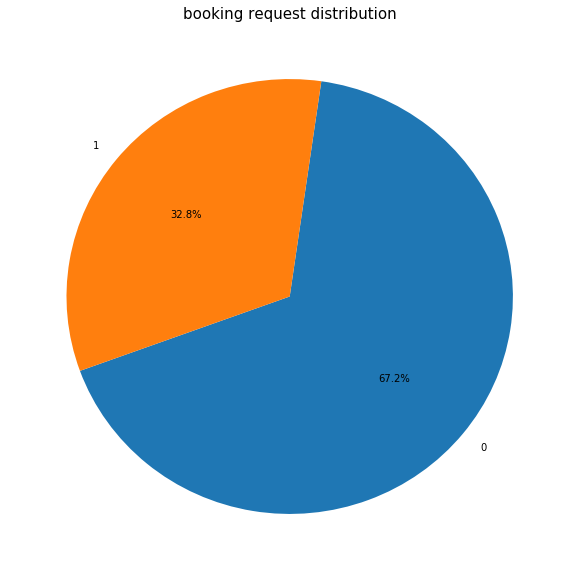

In [24]:
plt.figure(figsize=(10,10))
temp=df.dim_is_requested.value_counts()
labels = (np.array(temp.index))
sizes = (np.array((temp / temp.sum())*100))
plt.pie(sizes, labels=labels, 
        autopct='%1.1f%%', startangle=200)
plt.title("booking request distribution", fontsize=15)
plt.show()

## <a id='2-5'>2.5. Features Distribution and Correlation </a> 

In [25]:
df.describe(percentiles= [0.01,0.1, 0.2, 0.3, 0.4,0.5,0.6,0.7,0.8,0.9,0.99])

,dim_is_requested,m_effective_daily_price,m_pricing_cleaning_fee,dim_lat,dim_lng,dim_person_capacity,dim_is_instant_bookable,m_checkouts,m_reviews,days_since_last_booking,cancel_policy,image_quality_score,m_total_overall_rating,m_professional_pictures,dim_has_wireless_internet,ds_night_day_of_week,ds_night_day_of_year,ds_checkin_gap,ds_checkout_gap,occ_occupancy_plus_minus_7_ds_night,occ_occupancy_plus_minus_14_ds_night,occ_occupancy_trailing_90_ds,m_minimum_nights,m_maximum_nights,price_booked_most_recent,p2_p3_click_through_score,p3_inquiry_score,listing_m_listing_views_2_6_ds_night_decay,general_market_m_unique_searchers_0_6_ds_night,general_market_m_contacts_0_6_ds_night,general_market_m_reservation_requests_0_6_ds_night,general_market_m_is_booked_0_6_ds_night,m_available_listings_ds_night,kdt_score,r_kdt_listing_views_0_6_avg_n100,r_kdt_n_active_n100,r_kdt_n_available_n100,r_kdt_m_effective_daily_price_n100_p50,r_kdt_m_effective_daily_price_available_n100_p50,r_kdt_m_effective_daily_price_booked_n100_p50
count,184105.000000,184105.000000,184105.000000,184105.000000,184105.000000,184105.000000,184105.000000,183918.000000,183918.000000,146353.000000,184105.000000,170194.000000,183918.000000,183918.000000,184105.000000,184105.000000,184105.000000,181884.000000,181884.000000,163378.000000,163453.000000,173958.000000,181884.000000,1.818840e+05,146353.000000,57095.000000,54915.000000,181780.000000,184105.000000,184105.000000,184105.000000,184105.000000,184105.000000,184105.000000,184104.000000,184104.000000,184104.000000,184104.000000,184088.000000,171154.000000
mean,0.328193,149.452114,38.030839,43.551680,-44.281802,3.265723,0.145754,18.469486,10.976495,69.188401,4.154515,0.562086,47.904822,4.798943,0.937802,2.996692,174.617995,5.888588,6.123436,0.061362,0.079738,0.280205,5.000929,4.787054e+04,140.268597,0.231708,0.180923,0.384564,1701.956044,507.228922,91.568894,0.973107,18552.488596,1.067666,2.098422,90.234775,45.652262,109.250969,115.406114,95.609632
std,0.469557,272.334059,50.002629,6.817101,59.188853,2.009628,0.352860,32.313804,20.024748,123.551349,0.816535,0.306831,86.928247,8.506274,0.241516,2.004255,108.119456,2.197515,2.040891,0.159789,0.171283,0.311929,22.398568,1.007068e+07,159.855228,0.073607,0.073433,1.031855,686.160549,254.978187,48.587324,0.071515,9102.277198,0.523125,2.081693,75.808838,37.516638,64.022317,72.732509,48.748414
min,0.000000,-55.000000,0.000000,33.708763,-122.510925,1.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000e+00,0.000000,0.052968,0.013492,0.000000,316.714286,52.000000,13.142857,0.571429,1028.000000,-1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
1%,0.000000,29.000000,0.000000,33.813217,-122.466324,1.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.012382,0.000000,0.000000,0.000000,0.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,4.000000e+00,28.000000,0.100000,0.049100,0.000000,413.857143,66.571429,16.857143,0.714286,2096.000000,0.105263,0.000000,3.000000,2.000000,37.000000,37.523654,28.000000
10%,0.000000,51.085859,0.000000,34.039494,-118.603200,2.000000,0.000000,0.000000,0.000000,1.000000,3.000000,0.119123,0.000000,0.000000,1.000000,0.000000,31.000000,2.000000,2.000000,0.000000,0.000000,0.000000,1.000000,1.400000e+01,49.000000,0.148352,0.095441,0.000000,859.428571,221.285714,37.142857,0.857143,7681.000000,0.416667,0.346939,21.000000,12.000000,56.031825,59.000000,49.000000
20%,0.000000,65.128194,0.000000,34.092825,-118.410470,2.000000,0.000000,0.000000,0.000000,4.000000,3.000000,0.236453,0.000000,0.000000,1.000000,1.000000,61.000000,5.000000,7.000000,0.000000,0.000000,0.000000,1.000000,3.000000e+01,63.000000,0.171966,0.119400,0.000000,1114.428571,310.571429,49.857143,1.000000,9435.000000,0.592593,0.693878,38.000000,21.000000,71.023570,74.038385,60.002074
30%,0.000000,77.500000,0.000000,37.741190,-118.314700,2.000000,0.000000,1.0

In [26]:
skewness_rnking(df.drop(["ds_night",'ds'],axis=1))


Skew in numerical features: 



,Skew
m_maximum_nights,213.232267
m_effective_daily_price,20.184632
m_minimum_nights,14.719357
listing_m_listing_views_2_6_ds_night_decay,7.929498
price_booked_most_recent,7.038064
r_kdt_m_effective_daily_price_available_n100_p50,5.227252
r_kdt_m_effective_daily_price_n100_p50,4.914510
r_kdt_listing_views_0_6_avg_n100,4.081140
r_kdt_m_effective_daily_price_booked_n100_p50,3.974820
r_kdt_n_active_n100,3.962719


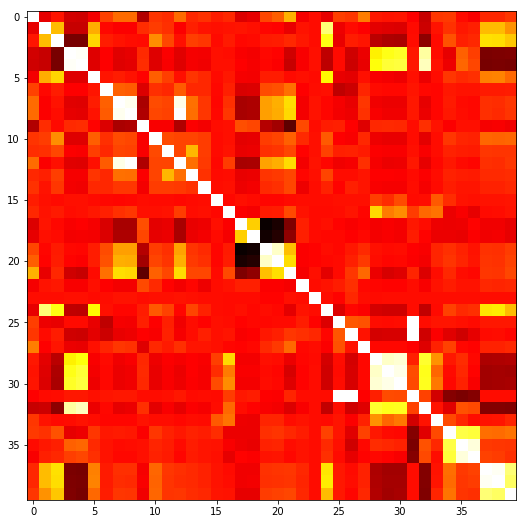

In [27]:
corrmat = df.corr()
plt.subplots(figsize=(12,9))
plt.imshow(corrmat, cmap='hot', interpolation='nearest')

# <a id='3'>3. Modeling</a>

## <a id='3-1'>3.1 baseline</a> 

I usually try Lightgbm with initial hyperprameters and 5 folds cross validation to do as a baseline model frist, which has good performance and efficient running process for large population. 

constant conlumns is: []
drop id_listing_anon
shape: (184105, 45)
drop ds_night
shape: (184105, 44)
drop ds
shape: (184105, 43)
drop id_user_anon
shape: (184105, 42)
X_train shape: (128873, 41)
y_train shape: (128873,)
X_test shape: (55232, 41)
y_test shape: (55232,)
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[10]	valid_0's auc: 0.798067
[2019-02-11 00:56:34.965277][0.5 sec] Fold 1 AUC : 0.798067
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[10]	valid_0's auc: 0.804629
[2019-02-11 00:56:35.455317][0.4 sec] Fold 2 AUC : 0.804629
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[10]	valid_0's auc: 0.800293
[2019-02-11 00:56:35.942933][0.4 sec] Fold 3 AUC : 0.800293
Training until validation scores don't improve for 200 rounds.
Did not meet early stopping. Best iteration is:
[10]	valid_0's auc: 0

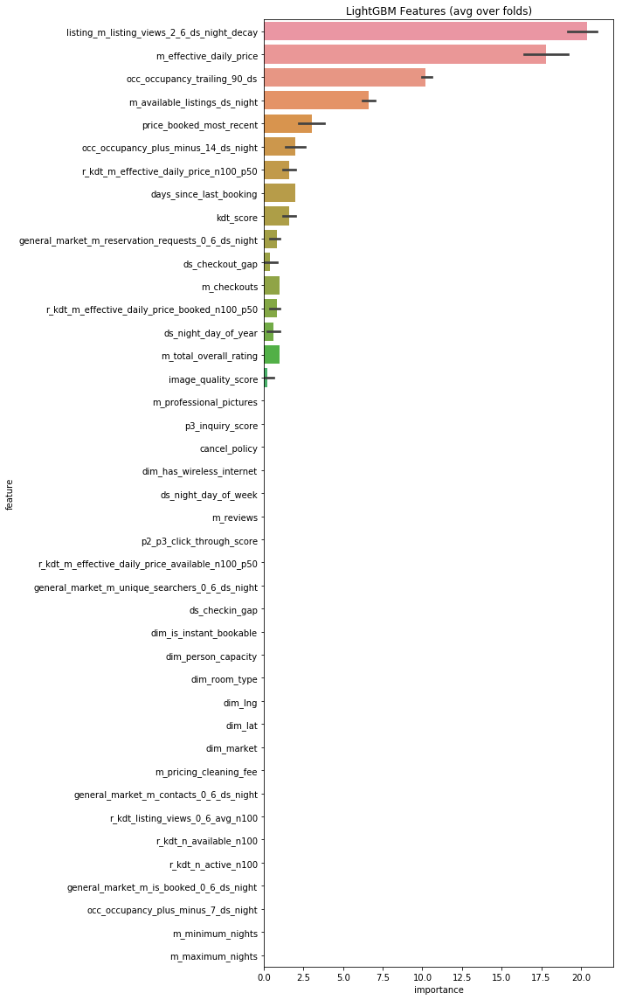

In [27]:
m = Model(name='lgbm_m1',clf=LGBMClassifier, n_estimators=10,
          comment='basic feature engineering',BASE_X_PATH = './input/df_process.csv')
feature_importance_df, full_auc,average_precision_score,lgbm,train_preds,y_train, test_preds,y_test = m.cv(tune=False)

## <a id='3-1-1'>3.1.1 model evaluation</a> 

ROC-AUC score is independent of the threshold set for classification because it only considers the rank of each prediction and not its absolute value. Sometimes, when the dataset is unbalanced, ROC will lose its meaning when one class dominates the population, I will choose precision-recall combination score as the metrics.

Performance evaluation using ROC-AUC and Precision-Recall Curve
Stablity: make sure No Over-fiting

#### ROC score

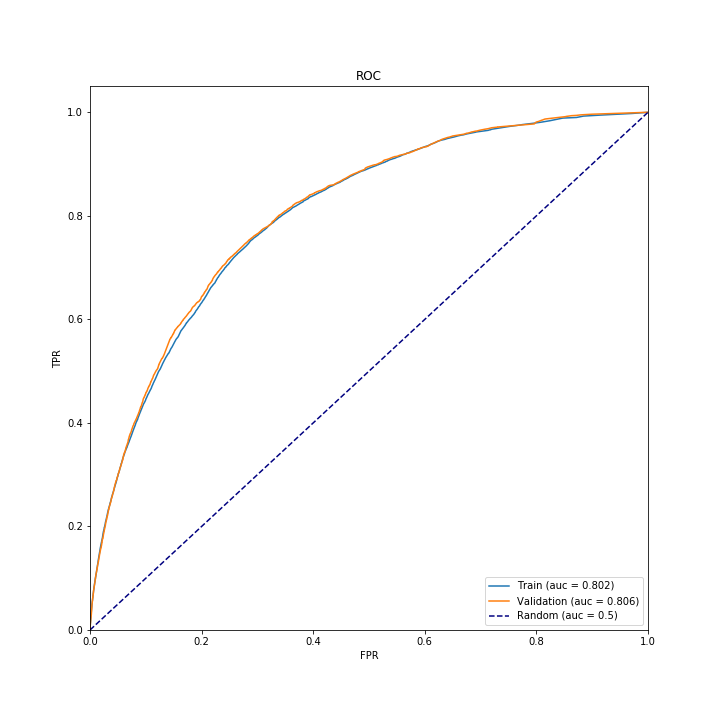

In [28]:
PATH = "./output/"
Image(filename = PATH + "roc_lgm.png", width=600, height=600)

#### PRC 

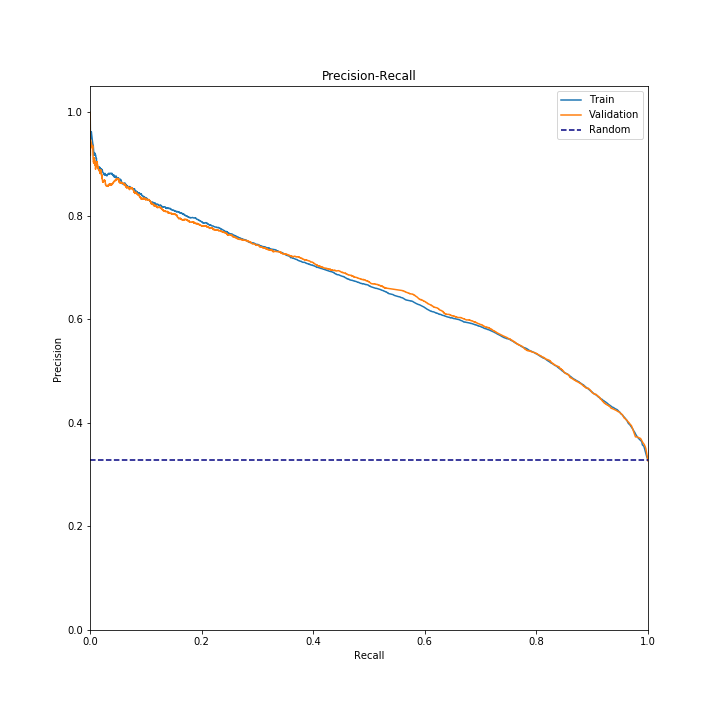

In [29]:
Image(filename = PATH + "pr_lgm.png", width=600, height=600)

#### Feature ranking 

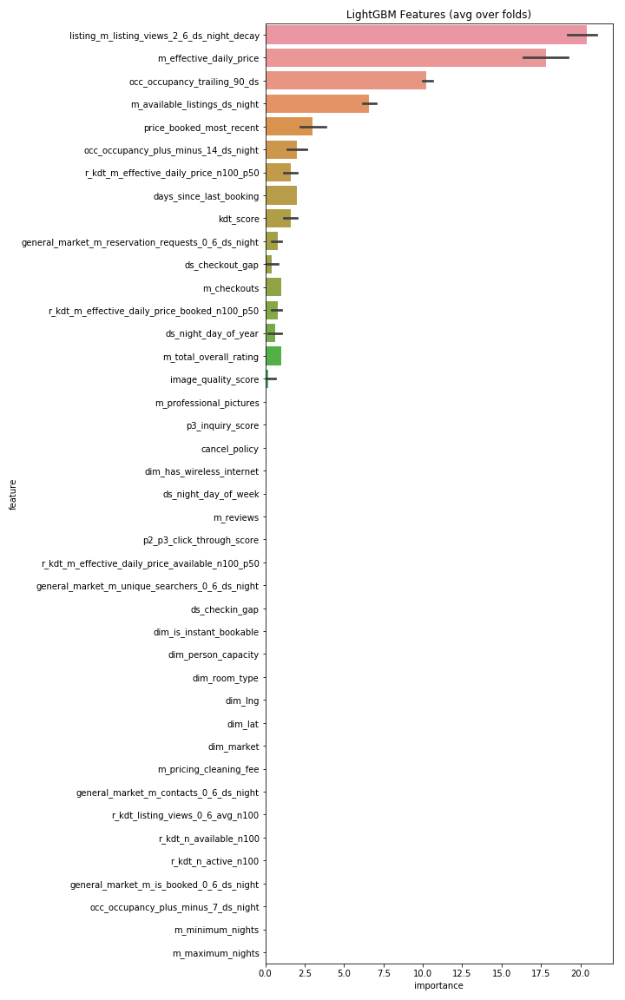

In [30]:
Image(filename = PATH + "lgbm_m1.png", width=600, height=800)

AUC and PRC scores of the lightgbm model without any tuning are 80% and 0.65.

#### Model score ranking 

In [31]:
model_score_ranking(y_train,train_preds,n_bin=10)

true_flag          
                                 count      mean
pred_flag_bin                                   
(0.17099999999999999, 0.179]     13687  0.034704
(0.179, 0.195]                   12141  0.078659
(0.195, 0.217]                   12857  0.124212
(0.217, 0.261]                   12870  0.175991
(0.261, 0.312]                   12887  0.229689
(0.312, 0.354]                   12891  0.320301
(0.354, 0.407]                   12879  0.425809
(0.407, 0.461]                   12893  0.512293
(0.461, 0.528]                   12886  0.616871
(0.528, 0.635]                   12882  0.774103

In [32]:
model_score_ranking(y_test,test_preds,n_bin=10)

true_flag          
                   count      mean
pred_flag_bin                     
(0.175, 0.18]       5596  0.025733
(0.18, 0.193]       5623  0.075760
(0.193, 0.218]      5369  0.131496
(0.218, 0.263]      5513  0.170687
(0.263, 0.314]      5516  0.221537
(0.314, 0.358]      5524  0.307929
(0.358, 0.409]      5661  0.410175
(0.409, 0.461]      5388  0.532294
(0.461, 0.528]      5518  0.625227
(0.528, 0.624]      5524  0.769551

The model probability scores are ranked which means high request booking probability has high score.

## <a id='3-2'>3.2 Model Improvement</a> 

### <a id='3-2-1'>3.2.1 Model Hyperprameter Tunning</a> 

In this sesion, I will use [Bayesian Optimization](https://github.com/fmfn/BayesianOptimization) to tune the parameters. I use 5 iterations here to save time.

constant conlumns is: []
drop id_listing_anon
shape: (184105, 45)
drop ds_night
shape: (184105, 44)
drop ds
shape: (184105, 43)
drop id_user_anon
shape: (184105, 42)
X_train shape: (128873, 41)
y_train shape: (128873,)
X_test shape: (55232, 41)
y_test shape: (55232,)
Initialization
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
 Step |   Time |      Value |   colsample_bytree |   learning_rate |   max_depth |   min_child_weight |   min_split_gain |   num_leaves |   reg_alpha |   reg_lambda |   subsample | 
Training until validation scores don't improve for 200 rounds.
[100]	valid_0's auc: 0.86234
[200]	valid_0's auc: 0.875843
[300]	valid_0's auc: 0.882381
[400]	valid_0's auc: 0.88618
[500]	valid_0's auc: 0.888558
Did not meet early stopping. Best iteration is:
[499]	valid_0's auc: 0.888574
Training until validation scores don't improve for 200 rounds.
[1

[100]	valid_0's auc: 0.866545
[200]	valid_0's auc: 0.879892
[300]	valid_0's auc: 0.885558
[400]	valid_0's auc: 0.889846
[500]	valid_0's auc: 0.892226
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.892226
Training until validation scores don't improve for 200 rounds.
[100]	valid_0's auc: 0.866959
[200]	valid_0's auc: 0.880656
[300]	valid_0's auc: 0.886646
[400]	valid_0's auc: 0.890382
[500]	valid_0's auc: 0.89217
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.89217
    5 | 00m16s |    0.89001 |             0.4206 |          0.0216 |      5.5252 |            15.8641 |           0.0404 |      23.1592 |      0.0632 |       0.0904 |      0.8651 | 
Bayesian Optimization
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
 Step |   Time |      Value |   colsample_bytree |   learning_rate |   max_depth |   min_child_wei

Training until validation scores don't improve for 200 rounds.
[100]	valid_0's auc: 0.861927
[200]	valid_0's auc: 0.875679
[300]	valid_0's auc: 0.88207
[400]	valid_0's auc: 0.885827
[500]	valid_0's auc: 0.888496
Did not meet early stopping. Best iteration is:
[497]	valid_0's auc: 0.888525
Training until validation scores don't improve for 200 rounds.
[100]	valid_0's auc: 0.866545
[200]	valid_0's auc: 0.879892
[300]	valid_0's auc: 0.885558
[400]	valid_0's auc: 0.889846
[500]	valid_0's auc: 0.892226
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.892226
Training until validation scores don't improve for 200 rounds.
[100]	valid_0's auc: 0.866959
[200]	valid_0's auc: 0.880656
[300]	valid_0's auc: 0.886646
[400]	valid_0's auc: 0.890382
[500]	valid_0's auc: 0.89217
Did not meet early stopping. Best iteration is:
[500]	valid_0's auc: 0.89217
   10 | 00m29s |    0.89001 |             0.6032 |          0.0829 |      5.6211 |            40.9428 |           0.0521 |      28

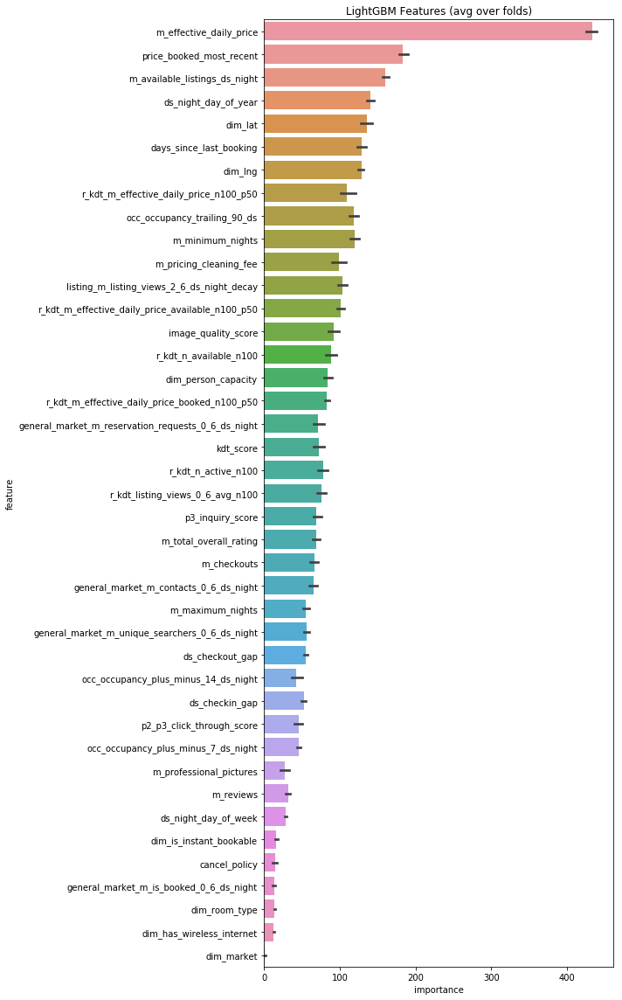

In [33]:
m = Model(name='lgbm_m2',clf=LGBMClassifier, n_estimators=500,
          comment='basic feature engineering',BASE_X_PATH = './input/df_process.csv')
feature_importance_df, full_auc,average_precision_score,lgbm,train_preds,y_train, test_preds,y_test = m.cv(tune=True)

#### ROC score

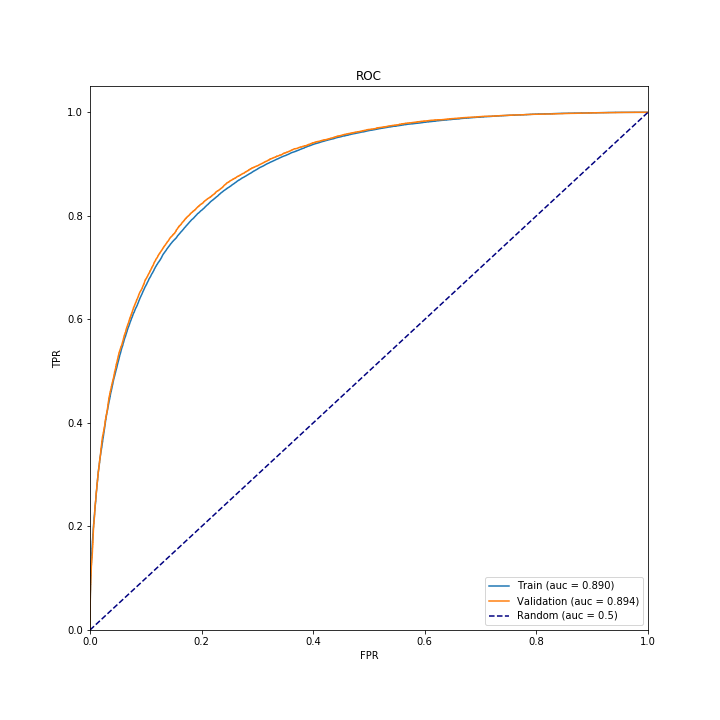

In [34]:
PATH = "./output/"
Image(filename = PATH + "roc_lgm.png", width=600, height=600)

#### PRC 

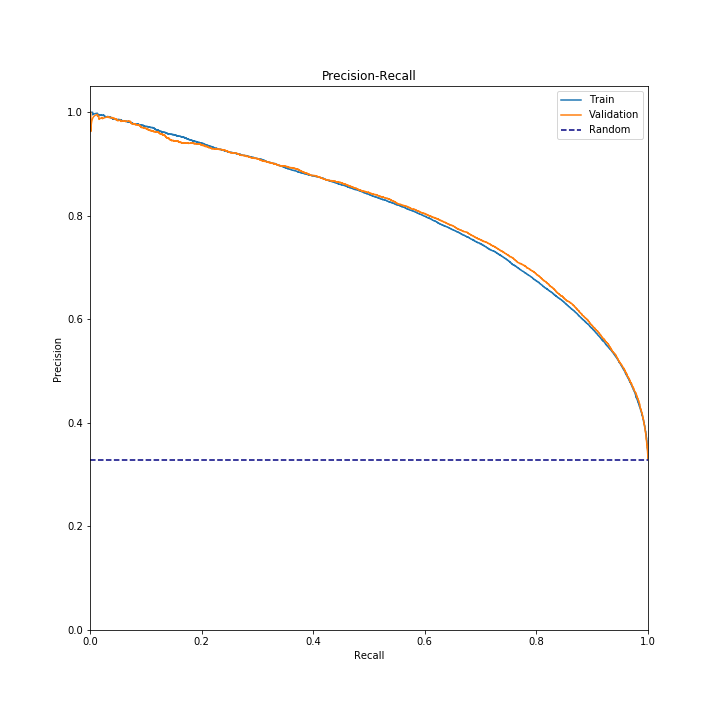

In [35]:
Image(filename = PATH + "pr_lgm.png", width=600, height=600)

#### Feature ranking 

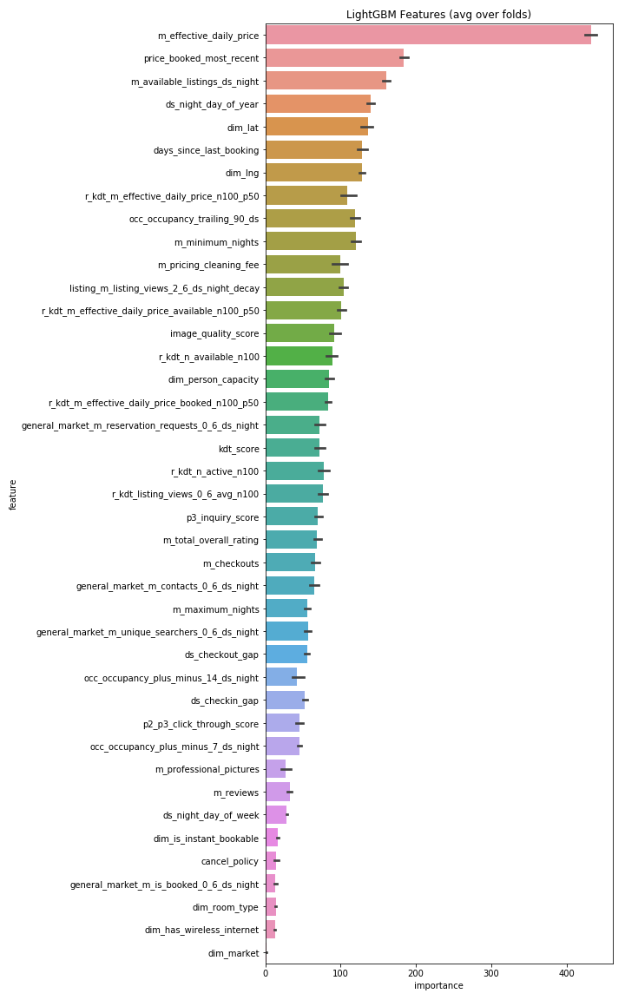

In [36]:
Image(filename = PATH + "lgbm_m2.png", width=600, height=800)

After tuning, the parameters are: {'objective': 'binary', 'learning_rate': 0.06364944912181639, 'colsample_bytree': 0.6991732207742619, 'max_depth': 2, 'metric': 'auc', 'n_estimators': 500, 'boosting_type': 'goss', 'num_leaves': 43, 'subsample': 0.3175163096273416, 'reg_alpha': 0.08457239705827989, 'reg_lambda': 0.08009796984325446, 'min_split_gain': 0.030141608949898126, 'min_child_weight': 43.98740526068577}, which improve the auc to 89% and pr score to 0.80.

### <a id='3-2-2'>3.2.2 Feature Enginerring</a> 

I create three types of features, which include ratio/interaction, sum and aggragation by categories features. Due to time is limited, I created some special features.

In [56]:
def add_pred_feats(df):
    print('df shape:',df.shape)
    df_train=df.copy()
    #fee and price ratio
    df_train['Total_price'] = df_train['m_pricing_cleaning_fee'] + df_train['m_effective_daily_price']    
    df_train['fee_per_guest'] = df_train['Total_price'] / df_train['dim_person_capacity']
    df_train['price_over_ratings'] = df_train['Total_price'] / df_train['m_total_overall_rating']
    df_train['checkout_conversion_rate'] = df_train['m_checkouts'] / df_train['m_reviews']
    df_train['Clean_fee_ratio'] = df_train['m_pricing_cleaning_fee'] / df_train['m_effective_daily_price'] #Clean_fee_ratio
    df_train['ratio_booked_effective_price'] = df_train['price_booked_most_recent'] / df_train['m_effective_daily_price']
    
    #Long Latitude
    df_train["N_location"] = df_train["dim_lat"] + df_train["dim_lng"]
    df_train["N_location_2"] = df_train["dim_lat"] * df_train["dim_lng"]
    df_train["N_location_2_rnd"] = df_train["N_location_2"].round(-4)
    df_train["dim_lat_rnd"]=df_train["dim_lat"].round(-4)
    df_train["dim_lng_rnd"]=df_train["dim_lng"].round(-4)
    
    #aggragate by room type
    group = df_train.groupby('dim_room_type')['m_reviews'].aggregate('mean').to_dict()
    df_train['avg_room_type_reviews'] = df_train['dim_room_type'].map(group)
    #map to the dim market
    market_cnt=df_train['dim_market'].value_counts().to_dict()
    df_train['n_dim_market']=df_train['dim_market'].map(market_cnt)
    
    #average price by market dim
    group = df_train.groupby('dim_market')['Total_price'].aggregate('mean').to_dict()
    df_train['avg_dim_market_total_price'] = df_train['dim_market'].map(group)
    print('df shape after feature creation:',df_train.shape)
    
    
    return df_train


In [58]:
df_feats=add_pred_feats(df)

df shape: (184105, 46)
df shape after feature creation: (184105, 60)


In [59]:
df_feats.to_csv("./input/df_feats.csv",index=False)

#### retrain model after feature creation

constant conlumns is: ['N_location_2_rnd', 'dim_lat_rnd', 'dim_lng_rnd']
drop id_listing_anon
shape: (184105, 56)
drop ds_night
shape: (184105, 55)
drop ds
shape: (184105, 54)
drop id_user_anon
shape: (184105, 53)
X_train shape: (128873, 52)
y_train shape: (128873,)
X_test shape: (55232, 52)
y_test shape: (55232,)
Training until validation scores don't improve for 200 rounds.
[25]	valid_0's auc: 0.832382
[50]	valid_0's auc: 0.853781
[75]	valid_0's auc: 0.863229
[100]	valid_0's auc: 0.868671
[125]	valid_0's auc: 0.87243
[150]	valid_0's auc: 0.875324
[175]	valid_0's auc: 0.878028
[200]	valid_0's auc: 0.880577
[225]	valid_0's auc: 0.882064
[250]	valid_0's auc: 0.883712
[275]	valid_0's auc: 0.884988
[300]	valid_0's auc: 0.886114
[325]	valid_0's auc: 0.886971
[350]	valid_0's auc: 0.888142
[375]	valid_0's auc: 0.889149
[400]	valid_0's auc: 0.890401
[425]	valid_0's auc: 0.891051
[450]	valid_0's auc: 0.891469
[475]	valid_0's auc: 0.892151
[500]	valid_0's auc: 0.892743
Did not meet early stoppi

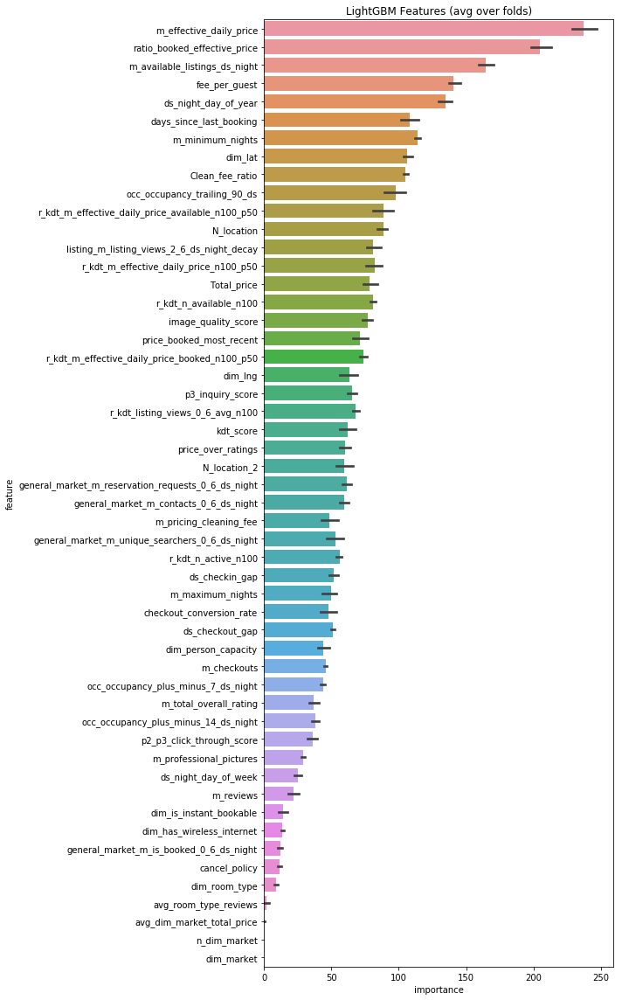

In [28]:
m = Model(name='lgbm_m3',clf=LGBMClassifier, n_estimators=500,
          comment='basic feature engineering',BASE_X_PATH = './input/df_feats.csv')
feature_importance_df, full_auc,average_precision_score,lgbm,train_preds,y_train, test_preds,y_test,train,test = m.cv(tune=False)

#### ROC score

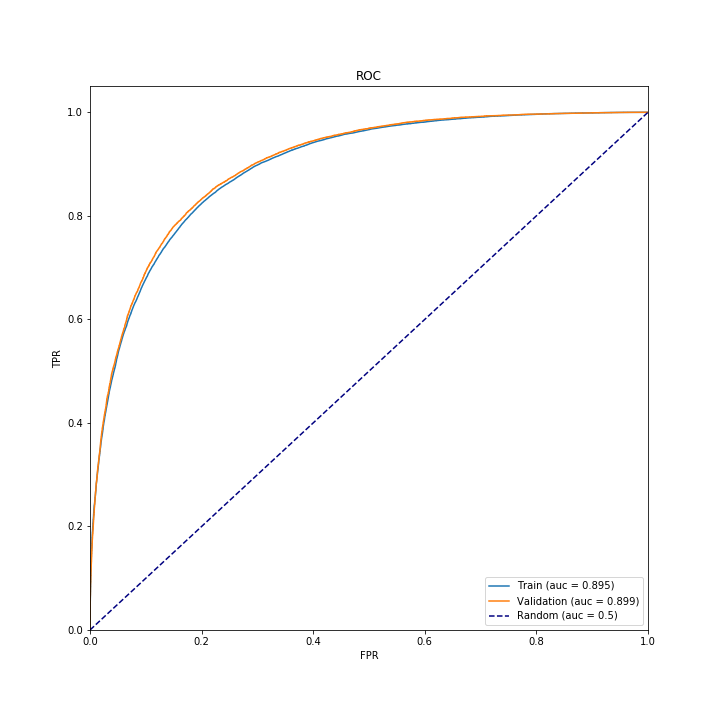

In [62]:
PATH = "./output/"
Image(filename = PATH + "roc_lgm.png", width=600, height=600)

#### PRC 

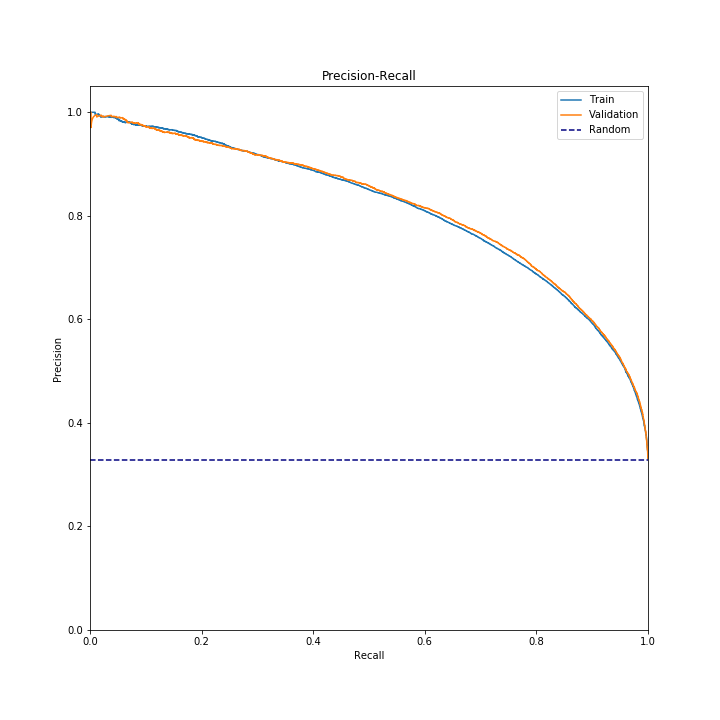

In [63]:
Image(filename = PATH + "pr_lgm.png", width=600, height=600)

#### Feature ranking 

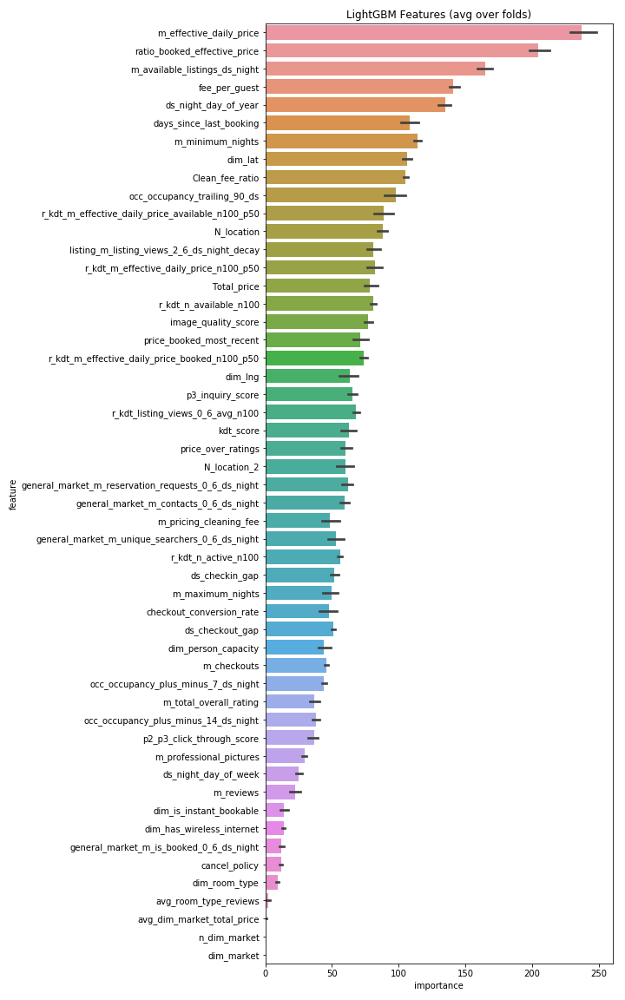

In [64]:
Image(filename = PATH + "lgbm_m3.png", width=600, height=800)

We see that the model performance is slightly improved to nealy 90%.

### <a id='3-2-3'>3.2.3 Model Ensembling</a> 

Usually I use out of fold stacking method or calculate geometric mean to ensebling different machine learning models. This method work well escpecially as the model we choose different ML method, such as linear and non linear. 

In [11]:
et_params = {
    'n_jobs': 16,
    'n_estimators': 500,
    'max_features': 0.5,
    'max_depth': 3,
    'min_samples_leaf': 2,
}

rf_params = {
    'n_jobs': 16,
    'n_estimators': 500,
    'max_features': 0.2,
    'max_depth': 3,
    'min_samples_leaf': 2,
}

xgb_params = {
    'n_estimators': 500,    
    'seed': 0,
    'colsample_bytree': 0.7,
    'silent': 1,
    'subsample': 0.7,
    'learning_rate': 0.1,
    'objective': 'reg:linear',
    'max_depth': 3,
    'num_parallel_tree': 1,
    'min_child_weight': 1,
    'eval_metric': 'auc',
    'nrounds': 200
}
lm_params={
            'alpha': 0.5

}
SEED=7
NFOLDS = 5

In [12]:
data_path='./input/df_feats.csv'

In [13]:
x_train, x_test, y_train, y_test=sklearn_prep_split(data_path)
ntrain = x_train.shape[0]
ntest = x_test.shape[0]
folds = KFold(n_splits=5, shuffle=True, random_state=SEED)
kf=folds.split(x_train,y_train)
x_train = np.array(x_train)
x_test = np.array(x_test)

xg = XgbWrapper(seed=SEED, params=xgb_params)
et = SklearnWrapper(clf=ExtraTreesClassifier, seed=SEED, params=et_params)
rf = SklearnWrapper(clf=RandomForestClassifier, seed=SEED, params=rf_params)
lm = SklearnWrapper(clf=Ridge, seed=SEED, params=lm_params)

drop id_listing_anon
shape: (184105, 59)
drop ds_night
shape: (184105, 58)
drop ds
shape: (184105, 57)
drop id_user_anon
shape: (184105, 56)


In [14]:
print("xg..")
xg_oof_train, xg_oof_test = get_oof_xgb(xg)
print("et..")
et_oof_train, et_oof_test = get_oof(et)
print("rf..")
rf_oof_train, rf_oof_test = get_oof(rf)
print("lm..")
lm_oof_train, lm_oof_test = get_oof(lm)

xg..
Training..
Predicting..
Predicting..
Training..
Predicting..
Predicting..
Training..
Predicting..
Predicting..
Training..
Predicting..
Predicting..
Training..
Predicting..
Predicting..
et..
rf..
lm..


In [15]:
x_train_stk = np.concatenate((xg_oof_train, et_oof_train, rf_oof_train, lm_oof_train), axis=1)
x_test_stk = np.concatenate((xg_oof_test, et_oof_test, rf_oof_test, lm_oof_test), axis=1)

In [16]:
dtrain = xgb.DMatrix(x_train, label=y_train)
dtest = xgb.DMatrix(x_test)

xgb_params = {
    'seed': 0,
    'colsample_bytree': 0.8,
    'silent': 1,
    'subsample': 0.6,
    'learning_rate': 0.01,
    'objective': 'reg:linear',
    'max_depth': 4,
    'num_parallel_tree': 1,
    'min_child_weight': 1,
    'eval_metric': 'auc',
}

print("xgb cv..")
res = xgb.cv(xgb_params, dtrain, num_boost_round=500, nfold=4, seed=SEED, stratified=False,
             early_stopping_rounds=25, verbose_eval=10, show_stdv=True)
best_nrounds = res.shape[0] - 1

print("meta xgb train..")
gbdt = xgb.train(xgb_params, dtrain, best_nrounds)
fi = gbdt.predict(dtest)
fi = np.array(fi)

xgb cv..
[0]	train-auc:0.789102+0.0011132	test-auc:0.786522+0.00283476
[10]	train-auc:0.816049+0.00369025	test-auc:0.813536+0.00519245
[20]	train-auc:0.819497+0.00159807	test-auc:0.816967+0.00344962
[30]	train-auc:0.821665+0.00196282	test-auc:0.81917+0.00368922
[40]	train-auc:0.823725+0.00152471	test-auc:0.821217+0.00337059
[50]	train-auc:0.825501+0.000921421	test-auc:0.822931+0.00249662
[60]	train-auc:0.826885+0.00110336	test-auc:0.824214+0.0025559
[70]	train-auc:0.82897+0.00131048	test-auc:0.826156+0.00282658
[80]	train-auc:0.830694+0.00138958	test-auc:0.827748+0.00294319
[90]	train-auc:0.832492+0.00135966	test-auc:0.829481+0.00292813
[100]	train-auc:0.833996+0.000982852	test-auc:0.830887+0.00268926
[110]	train-auc:0.835468+0.000997045	test-auc:0.832252+0.00246426
[120]	train-auc:0.836994+0.000793081	test-auc:0.833701+0.0024695
[130]	train-auc:0.838267+0.000782478	test-auc:0.834939+0.00241393
[140]	train-auc:0.839807+0.00071002	test-auc:0.836377+0.00223947
[150]	train-auc:0.841464+0.

In [17]:
pltres = [ (fi,y_test, "Validation")]

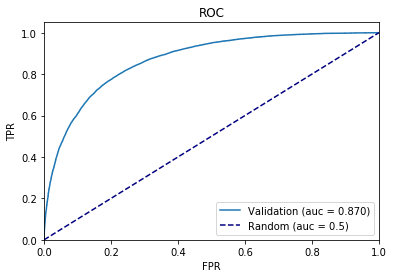

<Figure size 432x288 with 0 Axes>

In [18]:
get_roc_plot(pltres,'stk_roc')

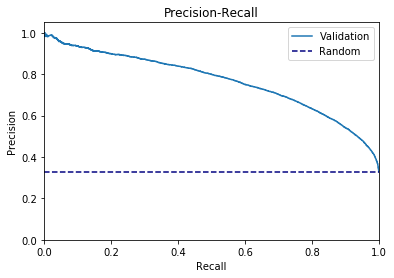

<Figure size 432x288 with 0 Axes>

In [19]:
get_pr_plot(pltres,'stk_roc')

Each model doesn't have been tunned so that there are 87% auc score. 

# <a id='4'>4 Business Recommendations</a> 

## <a id='4-1'>4.1 Recommendations</a> 

In [29]:
import shap

In [30]:
shap.initjs()

In [31]:
explainer = shap.TreeExplainer(lgbm)
shap_values = explainer.shap_values(train)

Rather than use a typical feature importance bar chart, we use a density scatter plot of SHAP values for each feature to identify how much impact each feature has on the model output for individuals in the validation dataset. Features are sorted by the sum of the SHAP value magnitudes across all samples. It is interesting to note that the m_effective_daily_price feature has more total model impact than the ds_night_day_of_year feature, but for those samples where ds_night_day_of_year gain matters it has more impact than ratio_booked_effective_price. In other words, ds_night_day_of_year effects a few predictions by a large amount, while ratio_booked_effective_price effects all predictions by a smaller amount.

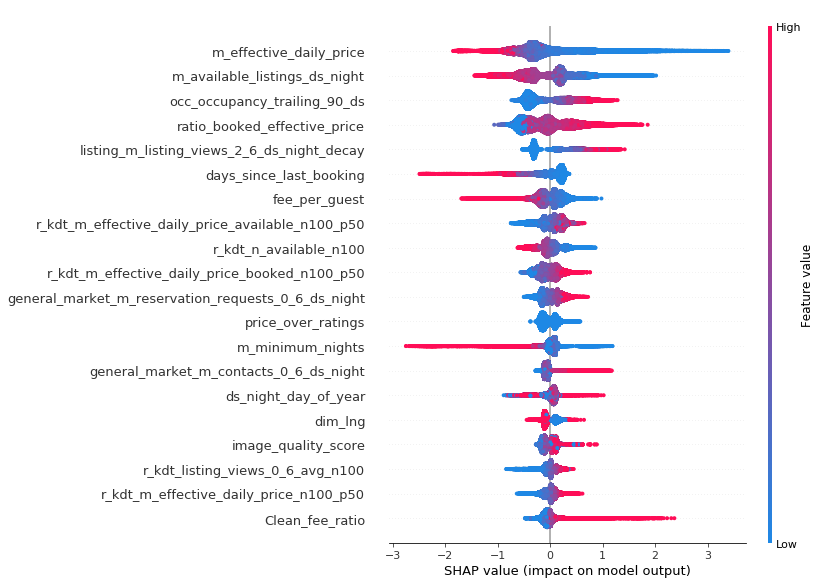

In [33]:
shap.summary_plot(shap_values, train)

It's easy to conclude from the plot abaove. The high daily price lower the booking request probabilty.Low value of minimum nights required for requesting to book that ds_night will increase the booking probability. 

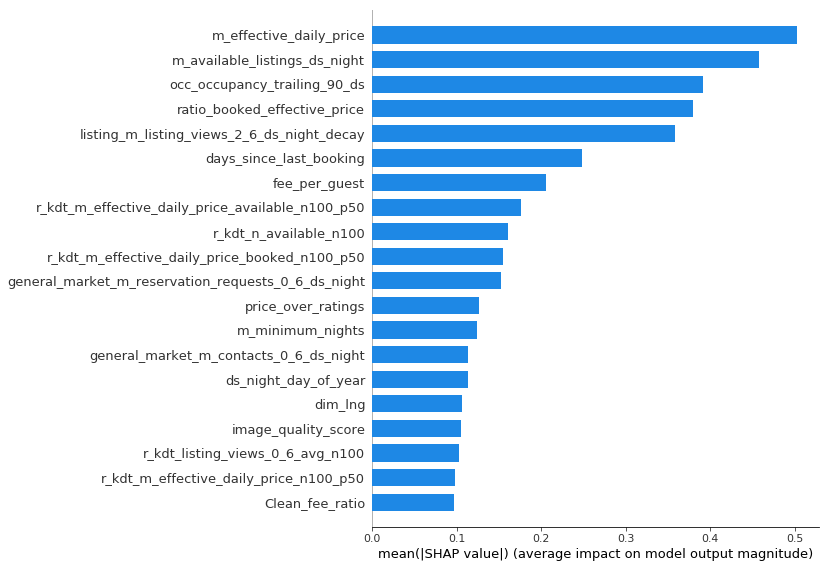

In [38]:
shap.summary_plot(shap_values, train, plot_type="bar")

In [39]:
# visualize the first prediction's explanation
shap.force_plot(explainer.expected_value, shap_values[0,:], train.iloc[0,:])

The above explanation shows features each contributing to push the model output from the base value (the average model output over the training dataset we passed) to the model output. Features pushing the prediction higher are shown in red, those pushing the prediction lower are in blue.

Let's plot SHAP dependence plots of high ranking importance features.

SHAP dependence plots show the effect of a single feature across the whole dataset. They plot a feature's value vs. the SHAP value of that feature across many samples. SHAP dependence plots are similar to partial dependence plots, but account for the interaction effects present in the features, and are only defined in regions of the input space supported by data. The vertical dispersion of SHAP values at a single feature value is driven by interaction effects, and another feature is chosen for coloring to highlight possible interactions.

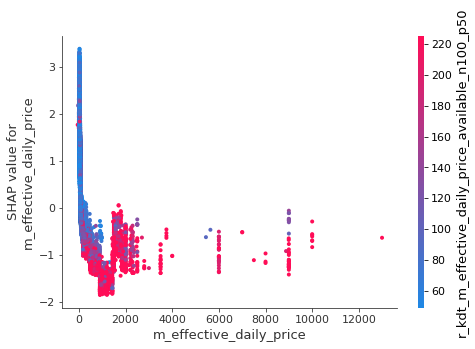

In [32]:
shap.dependence_plot('m_effective_daily_price', shap_values, train)

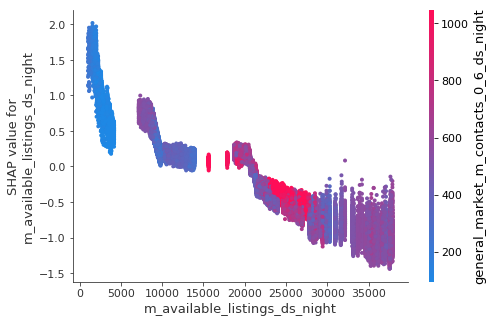

In [34]:
shap.dependence_plot('m_available_listings_ds_night', shap_values, train)

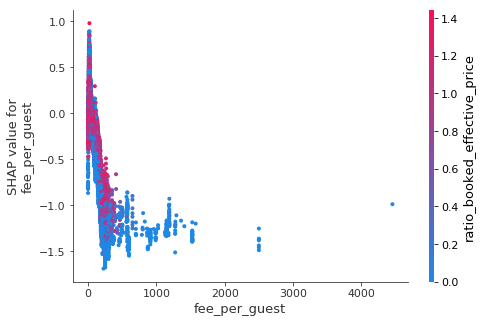

In [35]:
shap.dependence_plot('fee_per_guest', shap_values, train)

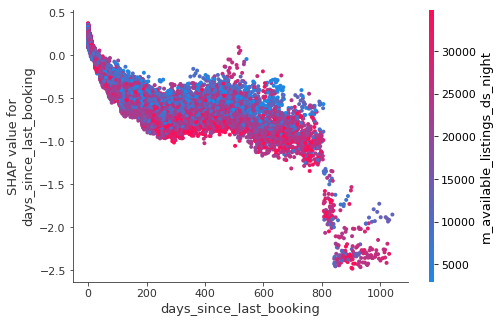

In [36]:
shap.dependence_plot('days_since_last_booking', shap_values, train)

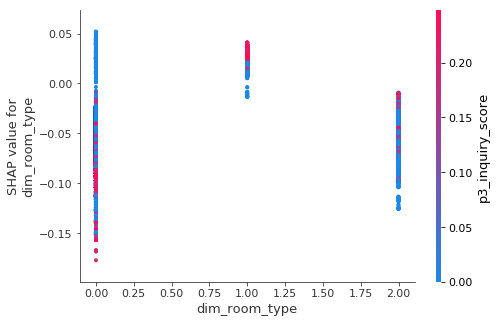

In [40]:
shap.dependence_plot('dim_room_type', shap_values, train)

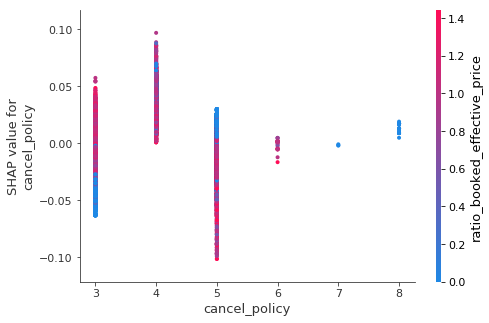

In [41]:
shap.dependence_plot('cancel_policy', shap_values, train)

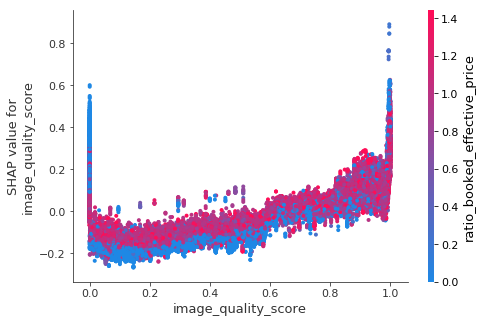

In [37]:
shap.dependence_plot('image_quality_score', shap_values, train)

This listing has higher daily price than its neighbors, and has no instant book option. This two reason got this listing has very low probability to be booked in the future. Then we could recommend the owner lower the listing price and add instant book option.

According to plots above, I recommend that could be change listing price, add more professional pictures, change the cancel policy, install wifi, maximum nights requirment, higher ratings, and so on. 

#### Recommendation:
- Get Instant Book
- Wifi
- Good Qality Pics
- Relax the minium booked nights requirement
- Clean fee is low
- Keep booking price(effective booking price) stable
- Give coupon or other incentives to encrouge people who haven't book for since last booking.
- Incentives for unique contacts searching.

## <a id='4-2'>4.2 Future work</a> 

Potentail Use Case:
    
    - Regional Demand Prediction
    - Revenue Prediction
    - Listing Price Recommendation
    - Listing ranking when search
    - Listing recommendation to traveler
    - Predict Cancellation Rate
    
Future Work:

- More jobs on the KD-T Model, get the feature characteristics mean, variance of the similar listings
- Description Score: understand listing description
- Get traverler information, do some listing recommendation for travelers.